In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import animation, rc
from IPython.display import HTML
from collections import Counter

## Table of Contents
* [I. Connect4 First modelisation](#chapter1)
* [II. QLearning agent *(Agent1)*](#chapter2)
    * [II.A Learning QTable with $\epsilon$ greedy policy](#section_2_1)
    * [II.B Evaluate : Agent1](#section_2_2)
        * [II.B.a Agent1 vs Random](#sub_section_2_2_1)
* [III. Readujusting  Modelling : Reward distribution](#chapter3)
    * [III.A Rewards modifications](#section_3_1)
    * [III.B Evaluation QLearning new agent: Agent 2](#section_3_2)
        * [III.B.a Agent2 vs Random](#sub_section_3_2_1)
        * [III.B.b Agent2 vs Agent1](#sub_section_3_2_2)
* [IV. Readujusting  Modelling :State space](#chapter4)
    * [IV.A  new State Space](#section_4_1)
    * [IV.B Evaluation  last QLearning agent : Agent 3](#section_4_2)
        * [IV.B.a Agent3 vs Random](#sub_section_4_2_1)
        * [IV.B.b Agent3 vs Agent1](#sub_section_4_2_2)
        * [IV.B.c Agent3 vs Agent2](#sub_section_4_2_3)


***


# I. Interface puissance4 + modelisation basique 
<a class="anchor" id="chapter1"></a>

**Definition of actions space and state space :**

>Base considered model:
>
>We note a board with n rows and p columns
>
>- States space: All the possible case  in the board : $\{1,...,n\times p\}$
>- Actions space : Each round a player choose between the p columns of the grid $\{ 1,2,...,p\}$



**We will rework this model later**: The chosen state space is not the better one: We will try to consider all the board in the state later instead of just a "local" vision

The problem is that taking all the board and its cells state need a larger state space :  Each 6 x7 cells can have 3 values : 0 ,1 and 2  resulting in a state space of size $3^{42}$  that will be hard to learn is the context of learning the Q Table

In [2]:
def generate_board(nb_row=6,nb_col=7):
    board=np.zeros(shape=(nb_row,nb_col))
    
    return board

In [3]:
board=generate_board()
board.shape

(6, 7)

In [4]:
actions=np.array(range(board.shape[1]))
S=np.asarray(range(6*7)).reshape((6,7))

print(actions)
S.shape

[0 1 2 3 4 5 6]


(6, 7)

In [5]:
def convert_state_to_board_pos(state_ind):
    return (int(state_ind/7),state_ind%7)

def convert_board_pos_to_state(x,y):
    S_tmp=S.reshape(6,7)
    return S_tmp[x,y] 



In [6]:

def play_action(action,board):
    x=0
    y=action
    col_board=board[:,action]
    latest_empty_row=col_board.shape[0]-1
    ind=0
    while ind < col_board.shape[0]:
        if col_board[ind]!=0:
            latest_empty_row=ind-1
            break
        ind+=1
    

    newState= convert_board_pos_to_state(latest_empty_row,y)
    return newState,latest_empty_row,y


In [7]:
def get_possible_action(board):
    "return not full columns"
    ind=0
    feasable_actions=[]
    for col in board.T:
        if col[0]==0:feasable_actions.append(ind)
        ind+=1
    return feasable_actions

In [8]:
cmap = colors.ListedColormap(['white', '#ffff00', 'red'])
play_id_to_col={1:"yellow",2:"red"}

In [9]:

def checkPlayerWin(board,player):
    #VERTICAL WIN
    isWinner=False

    for col in board.T:
        counter=0
        for el in col:
        
            if el==player:
                counter+=1
            else:counter=0
            if counter==4:
                isWinner=True
                print("Vertical Win !")
                break

    if isWinner:return isWinner
    # HORIZONTAL WIN
    for row in board:
        counter=0 
        for el in row:
            if el==player:
                counter+=1
            else:counter=0
            if counter==4:
                isWinner=True
                print("Horizontal Win !")
                break
    
    if isWinner:return isWinner
        
    # DIAGONALS 
    # sloped diagonals
    for col_ind in range(board.shape[1]-3):
        col=board[:,col_ind]
        for el_ind in range(col[:-3].shape[0]):
            if col[el_ind]==player:
                counter=1
                while True: 
                    if board[el_ind +counter,col_ind+counter]!=player:
                        break
                    counter+=1
                    if(counter==4):
                        isWinner=True
                        print("Diagonal  Sloped Win !")
                        break
    if isWinner:return isWinner

    # increased diagonals
    for col_ind in range(board.shape[1]-3):
        col=board[:,col_ind]
        for el_ind in range(3,3+col[3:].shape[0]):
            if col[el_ind]==player:
                counter=1
                while True: 
                    if board[el_ind -counter,col_ind+counter]!=player:
                        break
                    counter+=1
                    if(counter==4):
                        isWinner=True
                        print("Diagonal  Increase Win !")
                        break




    

    return isWinner

In [10]:
def step(action,state,board,player):
    term=False
    newState,x_new,y_new=play_action(action,board)
    board[x_new,y_new]=player
    isWinner=checkPlayerWin(board,player)
    if isWinner:
        reward=1
        term=True
    else: reward=0

    return newState,reward,term


----------Round 0
4 0 39 False
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]]
4 0 32 False
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]]
----------Round 1
6 0 41 False
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 1. 0. 1.]]
2 0 37 False
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0.]
 [0. 0. 2. 0. 1. 0. 1.]]
----------Round 2
0 0 35 False
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0.]
 [1. 0. 2. 0. 1. 0. 1.]]
4 0 25 False
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0.]
 [1. 0. 2. 0. 1. 0. 1.]

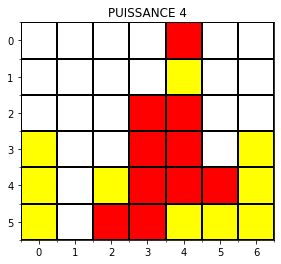

In [11]:
board=generate_board()
fig=plt.figure()
term=False
images=[]
state=0

i=0
while not term:
    print(f"----------Round {i}")
    for player in [1,2]:
        feas_actions=get_possible_action(board)
        if len(feas_actions)==0:
            print("No winner !")
            term=True
            break

        action=np.random.choice(feas_actions)
        newState,reward,term=step(action,state,board,player)
        print(action,state,newState,term)
        print(board)




        #-------------------------------
        # Stock board frame
        im=plt.imshow(board,animated=True,cmap=cmap)
        ax = plt.gca();
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 6, 1))
        ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
        ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=2)
        plt.title("PUISSANCE 4")
        images.append([im])
        # plt.pause(0.01)
        #--------------------------------
        if term: 
            print(f"Player {player} / color {play_id_to_col[player]} WIN")
            break

    i+=1
# plt.show()



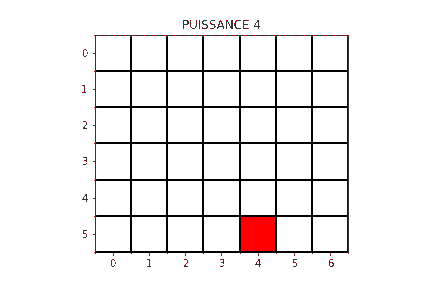

In [12]:

from matplotlib import animation, rc
from IPython.display import Image
ani = animation.ArtistAnimation(fig, images, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('2RandomAgentsGame.gif')
Image('2RandomAgentsGame.gif')
#--------------------
# Save in .mp4 format
# Using .mp4
# ani.save('filename.mp4')
# HTML(ani.to_html5_video())

***
***

# II. First QLearning agent 
<a class="anchor" id="chapter2"></a>

Based on this slide of the course
![](Qlearning-algo.png)

In [13]:
def initialize_Qtable():
    """
    Return O filled Qtable
    """
    col=np.asarray(range(6*7)).shape[0]
    return np.zeros((col,actions.shape[0]))

In [14]:
def updateQtable(Q,state,action,newState,reward,alpha,gamma):
    """
    Update the Q table in a episode
    """
    oldValue=Q[state,action]
    newValue= oldValue+ alpha*(reward + gamma* np.argmax(Q[state,:]) - oldValue)
    Q[state,action]=newValue
    # print(f"updating matrix in {state,action}from {oldValue} to {newValue}")

In [15]:
def epsilonGreedyPolicy(Q,actions,eps,state):
    "Choose actions from epsilon greedy policy"
    u=np.random.random()
    if u < eps:
        action=np.random.choice(actions) 
        print("explore action")
    else: 
        #Let firstly remove not feasable action
        Q_s=Q[state,:]
        Q_s[actions]
        action=actions[np.argmax(Q_s[actions])]
    return action
    

In [16]:
def stockFrame(board,Qs,frames):
    """
    Plot Board + Both QTable at each iteration
    """
    print("frame stock")
    im1 = ax[0].matshow(board, animated=True,cmap=cmap)
    im2 = ax[1].matshow(Qs[0], animated=True,cmap='gray')
    im3 = ax[2].matshow(Qs[1], animated=True,cmap='gray')
    frames.append([im1,im2,im3])

In [17]:
def episode(Qs,frames,eps=[0.3,0.5],players=[1,2],alpha=0.1,gamma=0.95,episode_nb=0):
    """
    Play episode wusing Qs tables
    alpha : learning rate
    gamma: discount factor
    eps: List containaing each proba of exploration for each player
    
    """
    assert len(Qs)==len(eps)==len(players)
    states=[0,0]
    board=generate_board()
    term=False
    niter=0

    #-------------------
    # Starting the episode
    while not term:
        print(f"-------ROUND {niter}")
        print(board)
        print(f"states of the players{states}")
        for state,player,Q,e in zip(states,players,Qs,eps) :

            #----------
            #Player choose action
            print(f'--PLAYER {player}-- epsilon : {e}')
            feas_actions=get_possible_action(board)
            if (len(feas_actions)==0):
                term=True
                break
            action=epsilonGreedyPolicy(Q,feas_actions,eps=e,state=state)
            newState,reward,term=step(action,state,board,player)
            print(f'from state: {state} using {action}')
            print(f'reached state:{newState} getting reward: {reward}')

            #---------
            # Updating Qtable 
            updateQtable(Q,state,action,newState,reward,alpha,gamma)
            stockFrame(board,Qs,frames)
            print(f'Updated row in Q :{Q[state,:]}')
            states[player-1]=newState
            if term: 
                print(f"Player {player} / color {play_id_to_col[player]} WIN")
                break
        
        niter+=1


-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
states of the players[0, 0]
--PLAYER 1-- epsilon : 0.3
explore action
from state: 0 using 5
reached state:40 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 0.5
from state: 0 using 0
reached state:35 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 1. 0.]]
states of the players[40, 35]
--PLAYER 1-- epsilon : 0.3
explore action
from state: 40 using 0
reached state:28 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 0.5
explore action
from state: 35 using 4
reached state:39 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
-------ROUND 2
[[0. 0. 0. 0

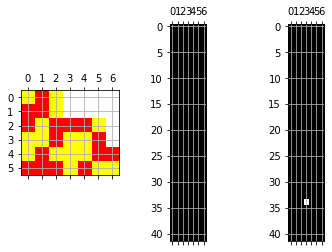

In [18]:
f,ax=plt.subplots(1,3)
frames=[]
ax[0].grid()
ax[1].grid()
ax[2].grid()
Q1=initialize_Qtable()
Q2=initialize_Qtable()
Qs=[Q1,Q2]
episode(Qs,frames)


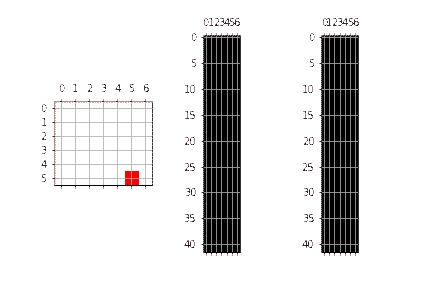

In [19]:

ani = animation.ArtistAnimation(f, frames, interval=800, blit=True,
                                repeat_delay=100)
ani.save('2QlearningLearningEpisode.gif')
Image('2QlearningLearningEpisode.gif')


***


## II.A Learning Qtables with 2 $\epsilon$ greedy policy
 <a class="anchor" id="section_2_1"></a> 

Q tables Learning step for our 2 agents

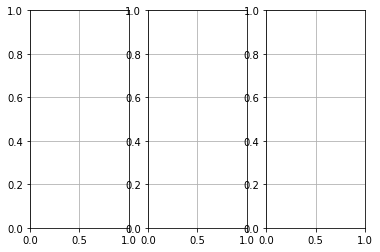

In [20]:

f,ax=plt.subplots(1,3)
ax[0].grid()
ax[1].grid()
ax[2].grid()

In [21]:
def learnQtables(ite=2):
    all_frames=[]
    Q1=initialize_Qtable()
    Q2=initialize_Qtable()
    Qs=[Q1,Q2]
    niter=0
    while niter < ite:
        frames=[]
        print(f"===========================>iteration {niter}")
        episode(Qs,frames,episode_nb=0)
        all_frames.append(frames)
        niter+=1
    return Q1,Q2,all_frames

In [22]:
Q1,Q2,all_frames=learnQtables(20)

===========================>iteration 0
-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
states of the players[0, 0]
--PLAYER 1-- epsilon : 0.3
from state: 0 using 0
reached state:35 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 0.5
explore action
from state: 0 using 2
reached state:37 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
states of the players[35, 37]
--PLAYER 1-- epsilon : 0.3
from state: 35 using 0
reached state:28 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 0.5
explore action
from state: 37 using 2
reached state:30 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--

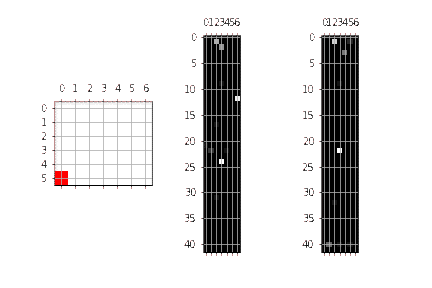

In [23]:
#See latest party

ani = animation.ArtistAnimation(f, all_frames[-1], interval=800, blit=True,
                                repeat_delay=100)
ani.save('learningGameAgent1.gif')
Image('learningGameAgent1.gif')

***
## II.B Evaluate Agent1 *(Qlearning)* <a class="anchor" id="section_2_2"></a>

### II.B.a Agent 1 *(QLearning)* vs Random <a class="anchor" id="sub_section_2_2_1"></a>

-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: 0 using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: 35 using 6
reached state:41 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 2.]]
--PLAYER 1--
from state: 41 using 0
reached state:28 getting reward: 0
--PLAYER 2--
from state: 28 using 4
reached state:39 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 2. 0. 2.]]
--PLAYER 1--
from state: 39 using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: 21 using 5
reached state:40 getting reward: 0
-------ROUND 3
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 

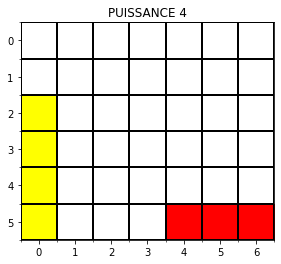

In [24]:

fig=plt.figure()
images=[]
state=0
board=generate_board()
term=False
niter=0

#-------------------
# Starting the episode
while not term:
    print(f"-------ROUND {niter}")
    print(board)
    for player in [1,2] :

        #----------
        #Player choose action
        print(f'--PLAYER {player}--')

        feas_actions=get_possible_action(board)
        if len(feas_actions)==0:
            print("No winner !")
            term=True
            break

        #------------
        #Player action choice
        if player==1:
            Q_s=Q1[state,:]
            Q_s[feas_actions]
            action=feas_actions[np.argmax(Q_s[feas_actions])]
        else:
            action=np.random.choice(feas_actions)

        newState,reward,term=step(action,state,board,player)
        print(f'from state: {state} using {action}')
        print(f'reached state:{newState} getting reward: {reward}')

        #-------------------------------
        # Stock board frame
        im=plt.imshow(board,animated=True,cmap=cmap)
        ax = plt.gca();
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 6, 1))
        ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
        ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=2)
        plt.title("PUISSANCE 4")
        images.append([im])
        state=newState
        if term: 
            print(f"Player {player} / color {play_id_to_col[player]} WIN")
            break
    
    niter+=1


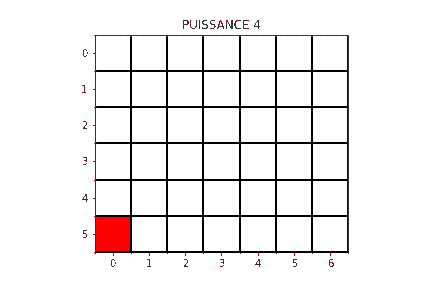

In [25]:

ani = animation.ArtistAnimation(fig, images, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('Agent1VSRandom.gif')
Image('Agent1VSRandom.gif')

In [26]:
def QLearnAgentvsRandom(Q_table,games=10):
    wins=[]
    print(games)
    for game in range(games):
        print(f"=====================================> Game{game}")
        state=0
        board=generate_board()
        term=False
        niter=0

        #-------------------
        # Starting the episode
        while not term:
            print(f"-------ROUND {niter}")
            print(board)
            for player in [1,2] :

                #----------
                #Player choose action
                print(f'--PLAYER {player}--')

                feas_actions=get_possible_action(board)
                if len(feas_actions)==0:
                    print("No winner !")
                    wins.append(0)
                    term=True
                    break

                #------------
                #Player action choice
                if player==1:
                    Q_s=Q_table[state,:]
                    action=feas_actions[np.argmax(Q_s[feas_actions])]
                else:
                    action=np.random.choice(feas_actions)

                newState,reward,term=step(action,state,board,player)
                print(f'from state: {state} using {action}')
                print(f'reached state:{newState} getting reward: {reward}')

                state=newState
                if term: 
                    print(f"Player {player} / color {play_id_to_col[player]} WIN")
                    wins.append(player)
                    break
            
            niter+=1
    return Counter(wins)



    

In [27]:

def QLearnAgentvsQLearnAgent(Q_table_player1,Q_table_player2,games=10):
    wins=[]
    print(games)
    for game in range(games):
        print(f"=====================================> Game{game}")
        state=[0,0]
        board=generate_board()
        term=False
        niter=0

        #-------------------
        # Starting the episode
        while not term:
            print(f"-------ROUND {niter}")
            print(board)
            for player in [1,2] :

                #----------
                #Player choose action
                print(f'--PLAYER {player}--')

                feas_actions=get_possible_action(board)
                if len(feas_actions)==0:
                    print("No winner !")
                    wins.append(0)
                    term=True
                    break

                #------------
                #Player action choice
                if player==1:
                    Q_s=Q_table_player1[state[0],:]
                    action=feas_actions[np.argmax(Q_s[feas_actions])]
                else:
                    Q_s=Q_table_player2[state[1],:]
                    action=feas_actions[np.argmax(Q_s[feas_actions])]

                newState,reward,term=step(action,state[player-1],board,player)
                print(f'from state: {state} using {action}')
                print(f'reached state:{newState} getting reward: {reward}')

                state[player-1]=newState
                if term: 
                    print(f"Player {player} / color {play_id_to_col[player]} WIN")
                    wins.append(player)
                    break
            
            niter+=1
    return Counter(wins)



    

In [28]:
tot_game=1000
win_count=QLearnAgentvsRandom(Q1,tot_game)

1000
=====================================> Game0
-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: 0 using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: 35 using 4
reached state:39 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 2. 0. 0.]]
--PLAYER 1--
from state: 39 using 0
reached state:28 getting reward: 0
--PLAYER 2--
from state: 28 using 0
reached state:21 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 2. 0. 0.]]
--PLAYER 1--
from state: 21 using 0
reached state:14 getting reward: 0
--PLAYER 2--
from state: 14 using 0
reached state:7 getting reward: 0
-------ROUND 3
[[0. 0. 0. 0. 0. 0. 0.]
 [2. 0.

In [29]:

print(f"QLearning agent wins :{win_count[1]} rate :{win_count[1]/tot_game}\nRandom agent wins:{win_count[2]} rate:{win_count[2]/tot_game}\n Drawn game:{win_count[0]}")

QLearning agent wins :830 rate :0.83
Random agent wins:170 rate:0.17
 Drawn game:0


In [30]:
Q_agent1=Q1

***
***

# III. Readjust reward  distribution to gradually lead  agent to victory
<a class="anchor" id="chapter3"></a>

## III.A. Reward modification 
<a class="anchor" id="section_3_1"></a>

- If win moove : $r=100$
- If moove allows aligning Horiz/Vertical/Diag 2 player disc  $r=10$ for each pairs.
- If moove allows aliging Horiz/Vertical/Diag 3 player disc from a 2 long combinaison, or created it from 2 single separated discs $r=50$ for each trio 

In [31]:
# Distribution of the reward
rewardsDict={2:10 ,3:50}

In [32]:
def step_bis(action,state,board,player):
    """
    rewritting step() fucntion with new function to send reward to an agent
    """
    term=False
    oldBoard=board.copy()
    newState,x_new,y_new=play_action(action,board)
    board[x_new,y_new]=player
    isWinner=checkPlayerWin(board,player)
    if isWinner:
        reward=100
        term=True
    else: reward=getReward(board,oldBoard,player)

    return newState,reward,term



In [33]:
def getReward(board,oldBoard,player):
    """
    We want to lead our agent to make new combinaison with its disc. 
    3 long combinaision is worth compare to 2 long combinaison.

    Moreover we want to lead him to develop already created combinaison
    """
    oldCombinaisons=searchCombinaison(player,oldBoard)
    newCombinaisons=searchCombinaison(player,board)
    print("old and new combaison :")
    print(oldCombinaisons)
    print(newCombinaisons)
    print("----")
    r=0
    for combi in newCombinaisons:
        starting_point=(combi[0],combi[1])
        l=combi[3]
        new=True
        for oldCombi in oldCombinaisons:
            if starting_point== (oldCombi[0], oldCombi[1]):
                new=False
                if combi[2]==oldCombi[2]:
                    # Then its not a new combinaison
                    if l > oldCombi[3]:
                        # We upgrade the combinaison
                        r+=rewardsDict[l]
                
                    break
        if new: r+=rewardsDict[l]
    return r


        
        

In [34]:
def searchCombinaison(player,board):
    """
    Return old combinaison relative to a player in the board
    """
    res=[]
    #---------------------------
    # Horizontal combinaisons
    board_copy=board.copy()
    for col_ind in range(board_copy.shape[1]):
        for row_ind in range(board_copy.shape[0]) :
            el=board_copy[row_ind,col_ind]
            if el==player:
                points,length=checkHorizontal(player,board_copy,row_ind,col_ind)
                if length >=2: 
                    res.append([row_ind,col_ind,"H",length])
                    for point in points:
                        board_copy[point[0],point[1]]=0
    #---------------------------
    # Vertical combinaisons
    board_copy=board.copy()
    for col_ind in range(board_copy.shape[1]):
        for row_ind in range(board_copy.shape[0]) :
            el=board_copy[row_ind,col_ind]
            if el==player:
                points,length=checkVertical(player,board_copy,row_ind,col_ind)
                if length >=2: 
                    res.append([row_ind,col_ind,"V",length])
                    for point in points:
                        board_copy[point[0],point[1]]=0
    #---------------------------
    # Diag Increased combinaisons
    board_copy=board.copy()
    for col_ind in range(board_copy.shape[1]):
        for row_ind in range(board_copy.shape[0]) :
            el=board_copy[row_ind,col_ind]
            if el==player:
                points,length=checkDiagInc(player,board_copy,row_ind,col_ind)
                if length >=2: 
                    res.append([row_ind,col_ind,"D-INC",length])
                    for point in points:
                        board_copy[point[0],point[1]]=0
    #---------------------------
    # Diag Slo combinaisons
    board_copy=board.copy()
    for col_ind in range(board_copy.shape[1]):
        for row_ind in range(board_copy.shape[0]) :
            el=board_copy[row_ind,col_ind]
            if el==player:
                points,length=checkDiagSlop(player,board_copy,row_ind,col_ind)
                if length >=2: 
                    res.append([row_ind,col_ind,"D-SLO",length])
                    for point in points:
                        board_copy[point[0],point[1]]=0
            
    return res

In [35]:
def checkHorizontal(player,board,row_ind,col_ind):
    counter=1
    col=col_ind+1

    points=[[row_ind,col_ind]]
    if col>board.shape[1]-1:
        return points,1

    while  True:
        if board[row_ind,col]==player: 
            counter+=1
            points.append([row_ind,col])
        else: break
        if col==board.shape[1]-1:break 
        col+=1
    return points,counter

def checkVertical(player,board,row_ind,col_ind):
    counter=1
    row=row_ind+1
    points=[[row_ind,col_ind]]
    if row>board.shape[0]-1:
        return points ,1
    while  True:
        if board[row,col_ind]==player: 
            counter+=1
            points.append([row,col_ind])
        else: break
        if row==board.shape[0]-1:break 
        row+=1
    return points,counter

def checkDiagInc(player,board,row_ind,col_ind):
    counter=1
    row=row_ind-1
    col=col_ind+1
    points=[[row_ind,col_ind]]
    if row <0 or col > board.shape[1]-1:
        return points,counter
    while  True:
        print(row,col)
        if board[row,col]==player: 
            counter+=1
            points.append([row,col])
        else: break
        if row==0:break 
        if col==board.shape[1]-1:break
        row-=1
        col+=1
    return points,counter

def checkDiagSlop(player,board,row_ind,col_ind):
    counter=1
    row=row_ind+1
    col=col_ind+1
    points=[[row_ind,col_ind]]
    if row >board.shape[0]-1 or col > board.shape[1]-1:
        return points,counter
    while  True:
        if board[row,col]==player: 
            counter+=1
            points.append([row,col])
        else: break
        if row==board.shape[0]-1:break 
        if col==board.shape[1]-1:break
        row+=1
        col+=1
    return points,counter

In [36]:

def episode_bis(Q_1,Q_2,frames,eps=[0.3,0.5],players=[1,2],alpha=0.1,gamma=0.95,episode_nb=0):
    """
    Play episode wusing Qs tables
    alpha : learning rate
    gamma: discount factor
    eps: List containaing each proba of exploration for each player
    
    """
    states=[0,0]
    board=generate_board()
    term=False
    niter=0
    Qs=[Q_1,Q_2]

    #-------------------
    # Starting the episode
    while not term:
        print(f"-------ROUND {niter}")
        print(board)
        print(f"states of the players{states}")
        for state,player,Q,e in zip(states,players,Qs,eps) :

            #----------
            #Player choose action
            print(f'--PLAYER {player}-- epsilon : {e}')
            feas_actions=get_possible_action(board)
            if (len(feas_actions)==0):
                term=True
                break
            action=epsilonGreedyPolicy(Q,feas_actions,eps=e,state=state)
            newState,reward,term=step_bis(action,state,board,player)
            print(f'from state: {state} using {action}')
            print(f'reached state:{newState} getting reward: {reward}')

            #---------
            # Updating Qtable 
            updateQtable(Q,state,action,newState,reward,alpha,gamma)
            stockFrame(board,Qs,frames)
            print(f'Updated row in Q :{Q[state,:]}')
            states[player-1]=newState
            if term: 
                print(f"Player {player} / color {play_id_to_col[player]} WIN")
                break
        
        niter+=1


-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
states of the players[0, 0]
--PLAYER 1-- epsilon : 0.3
4 1
old and new combaison :
[]
[]
----
from state: 0 using 0
reached state:35 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 0.5
3 1
old and new combaison :
[]
[]
----
from state: 0 using 0
reached state:28 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]]
states of the players[35, 28]
--PLAYER 1-- epsilon : 0.3
4 1
2 1
4 1
old and new combaison :
[]
[]
----
from state: 35 using 0
reached state:21 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 0.5
explore action
3 1
3 1
4 4
old and new combaison :
[]
[]
-

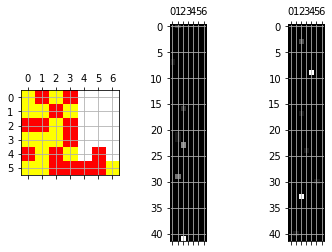

In [37]:

f,ax=plt.subplots(1,3)
frames=[]
ax[0].grid()
ax[1].grid()
ax[2].grid()
Q3=initialize_Qtable()
Q4=initialize_Qtable()

episode_bis(Q3,Q4,frames)


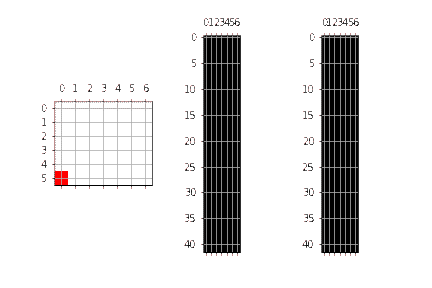

In [38]:

ani = animation.ArtistAnimation(f, frames, interval=800, blit=True,
                                repeat_delay=100)
ani.save('learningGameAgent2.gif')
Image('learningGameAgent2.gif')

### Learning

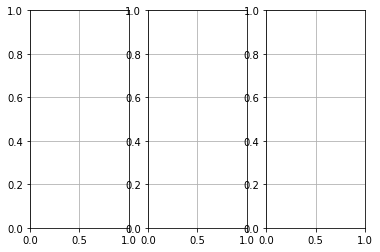

In [39]:

f,ax=plt.subplots(1,3)
ax[0].grid()
ax[1].grid()
ax[2].grid()

In [40]:

def learnQtables_bis(ite=2):
    """
    Learning again another QLerning agent also in its learning step
    """
    all_frames=[]
    Q3=initialize_Qtable()
    Q4=initialize_Qtable()
    niter=0
    while niter < ite:
        frames=[]

        print(f"===========================>iteration {niter}")
        episode_bis(Q3,Q4,frames,episode_nb=0)
        all_frames.append(frames)
        niter+=1
    return Q3,Q4,all_frames

def learnQtables_bis_bis(ite=2):
    """
    Learning again random Agent
    """
    all_frames=[]
    Q3=initialize_Qtable()
    Q4=initialize_Qtable()
    niter=0
    while niter < ite:
        frames=[]

        print(f"===========================>iteration {niter}")
        episode_bis(Q3,Q4,frames,eps=[0.3,1],episode_nb=0)
        all_frames.append(frames)
        niter+=1
    return Q3,Q4,all_frames

***

## III.B Evaluate Agent2 *(Qlearning)*
<a class="anchor" id="chapter3"></a>

### III.B.a Agent2 *(QLearning)* vs Random
<a class="anchor" id="sub_section_3_2_1"></a>


===========================>iteration 0
-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
states of the players[0, 0]
--PLAYER 1-- epsilon : 0.3
explore action
4 4
old and new combaison :
[]
[]
----
from state: 0 using 3
reached state:38 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 0.5
explore action
3 4
old and new combaison :
[]
[]
----
from state: 0 using 3
reached state:31 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 2. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]]
states of the players[38, 31]
--PLAYER 1-- epsilon : 0.3
explore action
4 4
4 4
4 5
old and new combaison :
[]
[[5, 3, 'H', 2]]
----
from state: 38 using 4
reached state:39 getting reward: 10
frame stock
Updated row in Q :[0. 0. 0

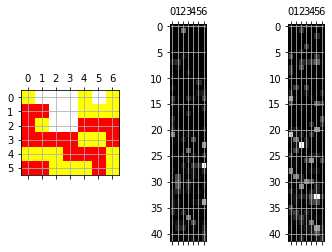

In [41]:
#Learn and play against random
f,ax=plt.subplots(1,3)
ax[0].grid()
ax[1].grid()
ax[2].grid()
Q3,Q4,all_frames=learnQtables_bis(100)
win_count1=QLearnAgentvsRandom(Q3,1000)
print(f"QLearning agent wins :{win_count[1]} rate :{win_count[1]/tot_game}\nRandom agent wins:{win_count[2]} rate:{win_count[2]/tot_game}\n Drawn game:{win_count[0]}")

Training step with a random agent :

In [42]:

#Learn and play against random
Q3_bis,Q4,all_frames=learnQtables_bis_bis(100)
win_count2=QLearnAgentvsRandom(Q3_bis,1000)
print(f"QLearning agent wins :{win_count[1]} rate :{win_count[1]/tot_game}\nRandom agent wins:{win_count[2]} rate:{win_count[2]/tot_game}\n Drawn game:{win_count[0]}")

===========================>iteration 0
-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
states of the players[0, 0]
--PLAYER 1-- epsilon : 0.3
4 1
old and new combaison :
[]
[]
----
from state: 0 using 0
reached state:35 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon : 1
explore action
old and new combaison :
[]
[]
----
from state: 0 using 6
reached state:41 getting reward: 0
frame stock
Updated row in Q :[0. 0. 0. 0. 0. 0. 0.]
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 2.]]
states of the players[35, 41]
--PLAYER 1-- epsilon : 0.3
4 1
3 1
4 1
old and new combaison :
[]
[[4, 0, 'V', 2]]
----
from state: 35 using 0
reached state:28 getting reward: 10
frame stock
Updated row in Q :[1. 0. 0. 0. 0. 0. 0.]
--PLAYER 2-- epsilon 

Difference between our 2 estimated QTables:

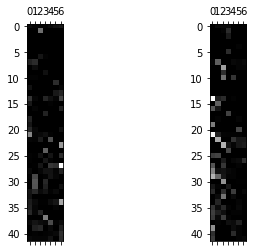

In [43]:
f,ax=plt.subplots(1,2)
ax[0].matshow(Q3,cmap="gray")
ax[1].matshow(Q3_bis,cmap="gray")

> We can see than the one who learned with the random agent *(The left one)* has more explore than the first one

In [44]:
Q_agent2=None
if win_count1[1]> win_count2[1]:
    Q_agent2=Q3
else:
    Q_agent2=Q3_bis

### III.B.b Agent2 vs  Agent1 
<a class="anchor" id="sub_section_3_2_2"></a>

First Agent QTable and new Agent QTable

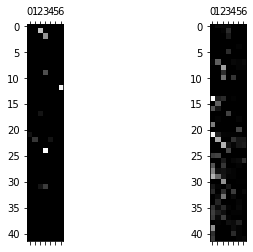

In [45]:
f,ax=plt.subplots(1,2)
ax[0].matshow(Q_agent1,cmap="gray")
ax[1].matshow(Q_agent2,cmap="gray")

The weight place on action reaaly diverged between this 2 agents

In [46]:

f,ax=plt.subplots(1,3)
ax[0].grid()
ax[1].grid()
ax[2].grid()
plt.close()

In [47]:
win_count=QLearnAgentvsQLearnAgent(Q_table_player1=Q_agent1,Q_table_player2=Q_agent2,games=1000)

1000
=====================================> Game0
-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [0, 0] using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: [35, 0] using 2
reached state:37 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [35, 37] using 0
reached state:28 getting reward: 0
--PLAYER 2--
from state: [28, 37] using 2
reached state:30 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [28, 30] using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: [21, 30] using 2
reached state:23 getting reward: 0
-------ROUN

In [48]:

print(f"Agent1 wins :{win_count[1]} rate :{win_count[1]/tot_game}\nAgent2 wins:{win_count[2]} rate:{win_count[2]/tot_game}\n Drawn game:{win_count[0]}")

Agent1 wins :1000 rate :1.0
Agent2 wins:0 rate:0.0
 Drawn game:0


=> The modificiation of the reward are really not good

Let visualize one game:

-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [0, 0] using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: [35, 0] using 2
reached state:37 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [35, 37] using 0
reached state:28 getting reward: 0
--PLAYER 2--
from state: [28, 37] using 2
reached state:30 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [28, 30] using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: [21, 30] using 2
reached state:23 getting reward: 0
-------ROUND 3
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.

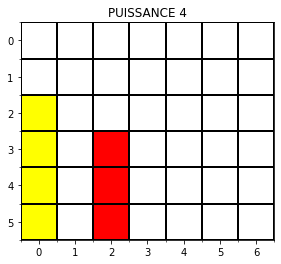

In [49]:

state=[0,0]
board=generate_board()
term=False
niter=0
fig=plt.figure()
images=[]

#-------------------
# Starting the episode
while not term:
    print(f"-------ROUND {niter}")
    print(board)
    for player in [1,2] :

        #----------
        #Player choose action
        print(f'--PLAYER {player}--')

        feas_actions=get_possible_action(board)
        if len(feas_actions)==0:
            print("No winner !")
            term=True
            break

        #------------
        #Player action choice
        if player==1:
            Q_s=Q_agent1[state[0],:]
            action=feas_actions[np.argmax(Q_s[feas_actions])]
        else:
            Q_s=Q_agent2[state[1],:]
            action=feas_actions[np.argmax(Q_s[feas_actions])]

        newState,reward,term=step(action,state[player-1],board,player)
        print(f'from state: {state} using {action}')
        print(f'reached state:{newState} getting reward: {reward}')
        #-------------------------------
        # Stock board frame
        im=plt.imshow(board,animated=True,cmap=cmap)
        ax = plt.gca();
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 6, 1))
        ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
        ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=2)

        plt.title("PUISSANCE 4")
        images.append([im])

        state[player-1]=newState
        if term: 
            print(f"Player {player} / color {play_id_to_col[player]} WIN")
            break
    
    niter+=1

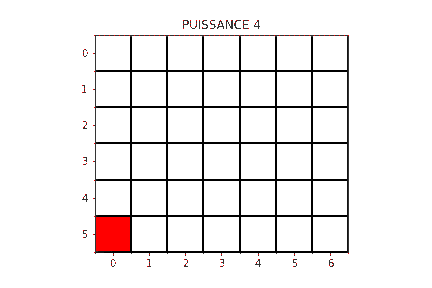

In [50]:

ani = animation.ArtistAnimation(fig, images, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('Agent1VSAgent2Game.gif')
Image('Agent1VSAgent2Game.gif')

>**=> All our 1000 games are the same : Agent2 is not in reality worst than Agent1 but he is not adapted**
>**Because our modelisation of state is just the latest position on the grid! And not all the grid state**
>
>With this modelisation each agent on ly look at its position and not at other. This is too random.
>
>**In the latest part of this notebook we will adapt our state space**

***
***

# IV. State Space modification
<a class="anchor" id="chapter4"></a>


> Each cell of the board can take 3 values : 0 , 1 or 2
>
> With 42 cells , we are gonna consider a state space of size : $3^{42}$

***

## IV.A. Modification of the state space
<a class="anchor" id="section_4_1"></a>

*Rmrq:We will need bigger learning step*

In [51]:
def board_to_index(board):
    index = 0
    for row in range(6):
        for col in range(7):
            index *= 3
            if board[row][col] == 1:
                index += 1
            elif board[row][col] == 2:
                index += 2
    return index

In [52]:

def play_action_bis(action,board):
    x=0
    y=action
    col_board=board[:,action]
    latest_empty_row=col_board.shape[0]-1
    ind=0
    while ind < col_board.shape[0]:
        if col_board[ind]!=0:
            latest_empty_row=ind-1
            break
        ind+=1
    

    disc_index= convert_board_pos_to_state(latest_empty_row,y)
    return disc_index,latest_empty_row,y


In [53]:

def step_bis_bis(action,state,board,player):
    """
    rewritting step() fucntion with new function to send reward to an agent
    """
    term=False
    oldBoard=board.copy()
    disc_index,x_new,y_new=play_action_bis(action,board)
    board[x_new,y_new]=player
    newState=board_to_index(board)
    isWinner=checkPlayerWin(board,player)
    if isWinner:
        reward=100
        term=True
    else: reward=getReward(board,oldBoard,player)

    return newState,reward,term



In [54]:

def initialize_Qtable_bis():
    """
    Return O filled Qtable in the following format :  {state: Qrow} 
    We can't create a 3**42 element matrix  !

    """
    return {}

In [55]:

def updateQtable_bis(Q_dict,state,action,newState,reward,alpha,gamma):
    """
    Update the Q table in a episode
    """
    try: 
        oldValue=Q_dict[state][action]
    except KeyError:
        Q_dict[state]=np.zeros(shape=actions.shape)
        oldValue=0
    newValue= oldValue+ alpha*(reward + gamma* np.argmax(Q_dict[state]) - oldValue)
    Q_dict[state][action]=newValue
    if (Q_dict[state]==np.zeros(shape=actions.shape)).all():
        Q_dict.pop(state)
        
    print(f"updating matrix in {state,action}from {oldValue} to {newValue}")

In [56]:

def epsilonGreedyPolicy_bis(Q_dict,actions,eps,state):
    "Choose actions from epsilon greedy policy"
    u=np.random.random()
    if u < eps:
        action=np.random.choice(actions) 
        print("explore action")
    else: 
        #Let firstly remove not feasable action
        try:
            Q_s=Q_dict[state]
        except:
            Q_dict[state]=np.zeros(shape=7)
            Q_s=Q_dict[state]
        action=actions[np.argmax(Q_s[actions])]
    return action
    

In [57]:
frames=[]
def episode_bis_bis(Q_1,frames,eps=[0.3,0.5],players=[1,2],alpha=0.1,gamma=0.95,episode_nb=0):
    """
    Play episode wusing Qs tables
    alpha : learning rate
    gamma: discount factor
    eps: List containaing each proba of exploration for each player
    
    """
    states=[0,0]
    board=generate_board()
    term=False
    niter=0
    Qs=[Q_1,None]
    images=[]

    #-------------------
    # Starting the episode
    while not term:
        print(f"-------ROUND {niter}")
        print(board)
        print(f"states of the players{states}")
        for state,player,Q,e in zip(states,players,Qs,eps) :

            #----------
            #Player choose action
            print(f'--PLAYER {player}-- epsilon : {e}')
            feas_actions=get_possible_action(board)
            if (len(feas_actions)==0):
                term=True
                break
            if player==1:
                action=epsilonGreedyPolicy_bis(Q,feas_actions,eps=e,state=state)
            else:
                action=np.random.choice(feas_actions)
            newState,reward,term=step_bis_bis(action,state,board,player)
            print(f'from state: {state} using {action}')
            print(f'reached state:{newState} getting reward: {reward}')

            #---------
            # Updating Qtable 
            if player==1:
                updateQtable_bis(Q,state,action,newState,reward,alpha,gamma)

            #--------------
            # Stock board frames
            im=plt.imshow(board,animated=True,cmap=cmap)
            ax = plt.gca();
            ax.set_xticks(np.arange(0, 7, 1))
            ax.set_yticks(np.arange(0, 6, 1))
            ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
            ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
            ax.grid(which='minor', color='black', linestyle='-', linewidth=2)
            plt.title("PUISSANCE 4")
            frames.append([im])

            states[player-1]=newState
            if term: 
                print(f"Player {player} / color {play_id_to_col[player]} WIN")
                break
        
        niter+=1


-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
states of the players[0, 0]
--PLAYER 1-- epsilon : 0.3
explore action
4 1
old and new combaison :
[]
[]
----
from state: 0 using 0
reached state:729 getting reward: 0
updating matrix in (0, 0)from 0 to 0.0
--PLAYER 2-- epsilon : 0.5
4 5
old and new combaison :
[]
[]
----
from state: 0 using 4
reached state:747 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 2. 0. 0.]]
states of the players[729, 747]
--PLAYER 1-- epsilon : 0.3
4 1
3 1
4 1
old and new combaison :
[]
[[4, 0, 'V', 2]]
----
from state: 729 using 0
reached state:1595070 getting reward: 10
updating matrix in (729, 0)from 0.0 to 1.0
--PLAYER 2-- epsilon : 0.5
4 5
4 5
old and new combaison :
[]
[]
----
from state: 747 using 6
reached state:1595072 gettin

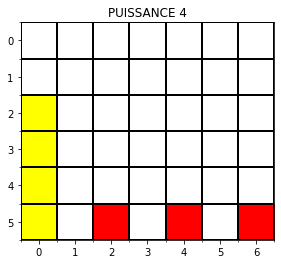

In [58]:

fig=plt.figure()
new_frames=[]
Q5=initialize_Qtable_bis()

episode_bis_bis(Q5,new_frames)


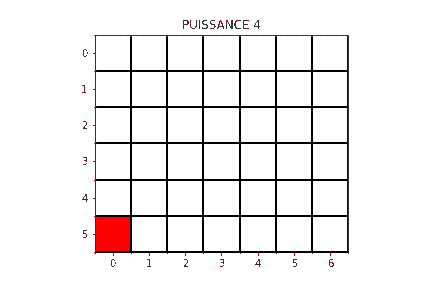

In [59]:

ani = animation.ArtistAnimation(fig, new_frames, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('tmp.gif')
Image('tmp.gif')

In [60]:
#We keep only rows with non null values  to optimize memory
Q5

{729: array([1., 0., 0., 0., 0., 0., 0.]),
 1595070: array([5., 0., 0., 0., 0., 0., 0.]),
 3488379473: array([10.,  0.,  0.,  0.,  0.,  0.,  0.])}

In [61]:

Q5=initialize_Qtable_bis()
fig=plt.figure()
def learnQtables_Agent3(ite=2):
    """
    Learning again another QLerning agent also in its learning step
    """
    all_frames=[]
    niter=0
    while niter < ite:
        frames=[]

        print(f"===========================>iteration {niter}")
        episode_bis_bis(Q5,frames,episode_nb=0)
        all_frames.append(frames)
        niter+=1
    return Q5,all_frames


<Figure size 432x288 with 0 Axes>

In [62]:
# How Q5 has been trained :
# Q5,all_frames=learnQtables_Agent3(1000)


# Using already trained Agent
#When loading form .npy file
Q5=np.load("Q5_trained.npy",allow_pickle=True)
Q5=Q5.item()

In [63]:
#save estimated Q table for agent 3
# np.save("Q5_trained.npy",Q5)

In [64]:
print(f"Number of state with not null Q row :{len(Q5)}")

Number of state with not null Q row :37380


***

## IV.B Evaluate Agent3 *(Qlearning)*
<a class="anchor" id="section_4_2"></a>

### IV.B.a  Agent3 vs Random
<a class="anchor" id="sub_section_4_2_1"></a>

In [65]:

def QLearnAgentvsRandom_bis(Q_dict,games=10):
    wins=[]
    print(games)
    for game in range(games):
        print(f"=====================================> Game{game}")
        state=0
        board=generate_board()
        term=False
        niter=0

        #-------------------
        # Starting the episode
        while not term:
            print(f"-------ROUND {niter}")
            print(board)
            for player in [1,2] :

                #----------
                #Player choose action
                print(f'--PLAYER {player}--')

                feas_actions=get_possible_action(board)
                if len(feas_actions)==0:
                    print("No winner !")
                    wins.append(0)
                    term=True
                    break

                #------------
                #Player action choice
                if player==1:
                    try:
                        Q_s=Q_dict[state]
                    except KeyError:
                        Q_s=np.zeros(shape=(7,))
                    action=feas_actions[np.argmax(Q_s[feas_actions])]
                else:
                    action=np.random.choice(feas_actions)

                newState,reward,term=step(action,state,board,player)
                print(f'from state: {state} using {action}')
                print(f'reached state:{newState} getting reward: {reward}')

                state=newState
                if term: 
                    print(f"Player {player} / color {play_id_to_col[player]} WIN")
                    wins.append(player)
                    break
            
            niter+=1
    return Counter(wins)



    

In [66]:

tot_game=1000
win_count=QLearnAgentvsRandom_bis(Q5,tot_game)

1000
=====================================> Game0
-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: 0 using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: 35 using 0
reached state:28 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: 28 using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: 21 using 4
reached state:39 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 2. 0. 0.]]
--PLAYER 1--
from state: 39 using 0
reached state:14 getting reward: 0
--PLAYER 2--
from state: 14 using 2
reached state:37 getting reward: 0
-------ROUND 3
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0

In [67]:

print(f"QLearning agent wins :{win_count[1]} rate :{win_count[1]/tot_game}\nRandom agent wins:{win_count[2]} rate:{win_count[2]/tot_game}\n Drawn game:{win_count[0]}")

QLearning agent wins :836 rate :0.836
Random agent wins:164 rate:0.164
 Drawn game:0


### IV.B.b  Agent3 vs Agent1
<a class="anchor" id="sub_section_4_2_2"></a>

Let see one game:

-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [0, 0] using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: [35, 0] using 0
reached state:28 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [35, 28] using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: [21, 28] using 0
reached state:14 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [21, 14] using 0
reached state:7 getting reward: 0
--PLAYER 2--
from state: [7, 14] using 0
reached state:0 getting reward: 0
-------ROUND 3
[[2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 

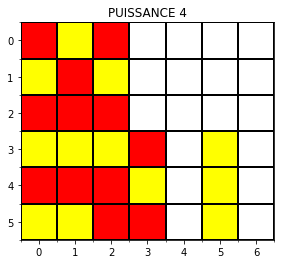

In [68]:

state=[0,0]
board=generate_board()
term=False
niter=0
fig=plt.figure()
images=[]
seen_state=[]

#-------------------
# Starting the episode
while not term:
    print(f"-------ROUND {niter}")
    print(board)
    for player in [1,2] :

        #----------
        #Player choose action
        print(f'--PLAYER {player}--')

        feas_actions=get_possible_action(board)
        if len(feas_actions)==0:
            print("No winner !")
            term=True
            break

        #------------
        #Player action choice
        if player==1:
            try:
                Q_s=Q5[state[player-1]]
                seen_state.append(True)
            except KeyError:
                # print("not in seen state")
                seen_state.append(False)

                Q_s=np.zeros(shape=(7,))
            action=feas_actions[np.argmax(Q_s[feas_actions])]
        else:
            Q_s=Q_agent1[state[1],:]
            action=feas_actions[np.argmax(Q_s[feas_actions])]

        newState,reward,term=step(action,state[player-1],board,player)
        print(f'from state: {state} using {action}')
        print(f'reached state:{newState} getting reward: {reward}')
        #-------------------------------
        # Stock board frame
        im=plt.imshow(board,animated=True,cmap=cmap)
        ax = plt.gca();
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 6, 1))
        ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
        ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=2)

        plt.title("PUISSANCE 4")
        images.append([im])

        state[player-1]=newState
        if term: 
            print(f"Player {player} / color {play_id_to_col[player]} WIN")
            break
    
    niter+=1

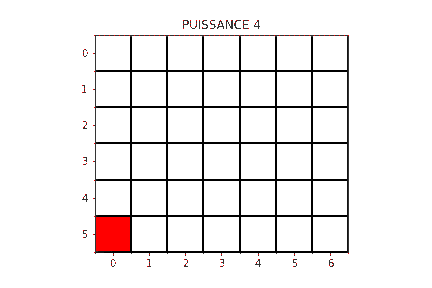

In [69]:

ani = animation.ArtistAnimation(fig, images, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('Agent3VSAgent1.gif')
Image('Agent3VSAgent1.gif')

 Yellow player is Agent3

In [70]:

print(f"Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):{np.any(seen_state)}")
if np.any(seen_state): print(f"Number of estimated Q table rows used: {Counter(seen_state)[True]} ")

Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):True
Number of estimated Q table rows used: 3 



### IV.B.c  Agent3 VS Agent2
<a class="anchor" id="sub_section_4_2_3"></a>

-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [0, 0] using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: [35, 0] using 2
reached state:37 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [35, 37] using 0
reached state:28 getting reward: 0
--PLAYER 2--
from state: [28, 37] using 2
reached state:30 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [28, 30] using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: [21, 30] using 2
reached state:23 getting reward: 0
-------ROUND 3
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.

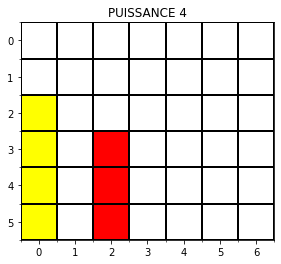

In [71]:

state=[0,0]
board=generate_board()
term=False
niter=0
fig=plt.figure()
images=[]

#-------------------
# Starting the episode
seen_state=[]
while not term:
    print(f"-------ROUND {niter}")
    print(board)
    for player in [1,2] :

        #----------
        #Player choose action
        print(f'--PLAYER {player}--')

        feas_actions=get_possible_action(board)
        if len(feas_actions)==0:
            print("No winner !")
            term=True
            break

        #------------
        #Player action choice
        if player==1:
            try:
                Q_s=Q5[state[player-1]]
                seen_state.append(True)
            except KeyError:
                seen_state.append(False)
                Q_s=np.zeros(shape=(7,))
            action=feas_actions[np.argmax(Q_s[feas_actions])]
        else:
            Q_s=Q_agent2[state[1],:]
            action=feas_actions[np.argmax(Q_s[feas_actions])]

        newState,reward,term=step(action,state[player-1],board,player)
        print(f'from state: {state} using {action}')
        print(f'reached state:{newState} getting reward: {reward}')
        #-------------------------------
        # Stock board frame
        im=plt.imshow(board,animated=True,cmap=cmap)
        ax = plt.gca();
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 6, 1))
        ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
        ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=2)

        plt.title("PUISSANCE 4")
        images.append([im])

        state[player-1]=newState
        if term: 
            print(f"Player {player} / color {play_id_to_col[player]} WIN")
            break
    
    niter+=1

In [72]:
print(f"Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):{np.any(seen_state)}")
if np.any(seen_state): print(f"Number of estimated Q table rows used: {Counter(seen_state)[True]} ")

Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):False


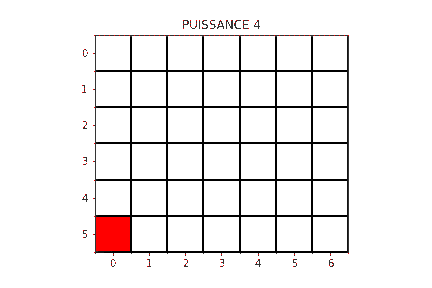

In [73]:

ani = animation.ArtistAnimation(fig, images, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('Agent3VSAgent2.gif')
Image('Agent3VSAgent2.gif')

Yellow player is Agent3

**Agent3 is missing of training**. He losses because in the game there is too much not met before state

 Lets try to train Agent3 with agent2

In [74]:

frames=[]
def episode_bis_bis_bis(Q_1,frames,eps=[0.3,0.5],players=[1,2],alpha=0.1,gamma=0.95,episode_nb=0):
    """
    Play episode wusing Qs tables
    alpha : learning rate
    gamma: discount factor
    eps: List containaing each proba of exploration for each player
    
    """
    states=[0,0]
    board=generate_board()
    term=False
    niter=0
    Qs=[Q_1,None]
    images=[]

    #-------------------
    # Starting the episode
    while not term:
        print(f"-------ROUND {niter}")
        print(board)
        print(f"states of the players{states}")
        for state,player,Q,e in zip(states,players,Qs,eps) :

            #----------
            #Player choose action
            print(f'--PLAYER {player}-- epsilon : {e}')
            feas_actions=get_possible_action(board)
            if (len(feas_actions)==0):
                term=True
                break
            if player==1:
                action=epsilonGreedyPolicy_bis(Q_1,feas_actions,eps=e,state=state)
                newState,reward,term=step_bis_bis(action,state,board,player)
            else:
                Q_s=Q_agent2[states[1],:]
                action=feas_actions[np.argmax(Q_s[feas_actions])]
                newState,reward,term=step_bis(action,state,board,player)
            print(f'from state: {state} using {action}')
            print(f'reached state:{newState} getting reward: {reward}')

            #---------
            # Updating Qtable 
            if player==1:
                updateQtable_bis(Q,state,action,newState,reward,alpha,gamma)

            #--------------
            # Stock board frames
            im=plt.imshow(board,animated=True,cmap=cmap)
            ax = plt.gca();
            ax.set_xticks(np.arange(0, 7, 1))
            ax.set_yticks(np.arange(0, 6, 1))
            ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
            ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
            ax.grid(which='minor', color='black', linestyle='-', linewidth=2)
            plt.title("PUISSANCE 4")
            frames.append([im])

            states[player-1]=newState
            if term: 
                print(f"Player {player} / color {play_id_to_col[player]} WIN")
                break
        
        niter+=1


In [75]:
Q5_bis=initialize_Qtable_bis()
fig=plt.figure()
def learnQtables_Agent3_bis(ite=2):
    """
    Learning again another QLerning agent also in its learning step
    """
    all_frames=[]
    niter=0
    while niter < ite:
        frames=[]

        print(f"===========================>iteration {niter}")
        episode_bis_bis_bis(Q5_bis,frames,episode_nb=0)
        all_frames.append(frames)
        niter+=1
    return Q5_bis,all_frames


<Figure size 432x288 with 0 Axes>

In [85]:
# Q5_bis,all_frames=learnQtables_Agent3_bis(2000)
# np.save("Q5_trained_bis.npy",Q5_bis)

In [86]:
#--------------
# Loading already trained agent
Q5_bis=np.load("Q5_trained_bis.npy",allow_pickle=True)
Q5_bis=Q5_bis.item()

In [78]:

print(f"Number of state with not null Q row :{len(Q5_bis)}")

Number of state with not null Q row :864


-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [0, 0] using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: [35, 0] using 0
reached state:28 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [35, 28] using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: [21, 28] using 0
reached state:14 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [21, 14] using 0
reached state:7 getting reward: 0
--PLAYER 2--
from state: [7, 14] using 0
reached state:0 getting reward: 0
-------ROUND 3
[[2. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 

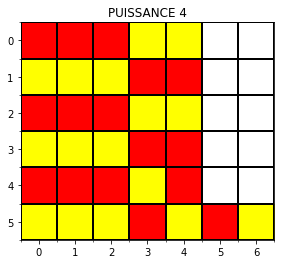

In [79]:

state=[0,0]
board=generate_board()
term=False
niter=0
fig=plt.figure()
images=[]
seen_state=[]

#-------------------
# Starting the episode
while not term:
    print(f"-------ROUND {niter}")
    print(board)
    for player in [1,2] :

        #----------
        #Player choose action
        print(f'--PLAYER {player}--')

        feas_actions=get_possible_action(board)
        if len(feas_actions)==0:
            print("No winner !")
            term=True
            break

        #------------
        #Player action choice
        if player==1:
            try:
                Q_s=Q5_bis[state[player-1]]
                seen_state.append(True)
            except KeyError:
                # print("not in seen state")
                seen_state.append(False)

                Q_s=np.zeros(shape=(7,))
            action=feas_actions[np.argmax(Q_s[feas_actions])]
        else:
            Q_s=Q_agent1[state[1],:]
            action=feas_actions[np.argmax(Q_s[feas_actions])]

        newState,reward,term=step(action,state[player-1],board,player)
        print(f'from state: {state} using {action}')
        print(f'reached state:{newState} getting reward: {reward}')
        #-------------------------------
        # Stock board frame
        im=plt.imshow(board,animated=True,cmap=cmap)
        ax = plt.gca();
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 6, 1))
        ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
        ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=2)

        plt.title("PUISSANCE 4")
        images.append([im])

        state[player-1]=newState
        if term: 
            print(f"Player {player} / color {play_id_to_col[player]} WIN")
            break
    
    niter+=1

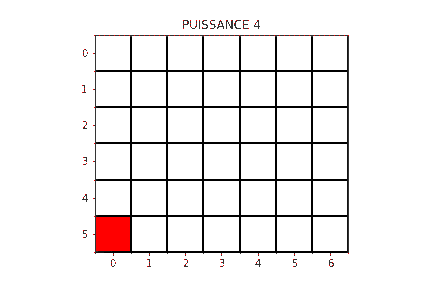

In [80]:

ani = animation.ArtistAnimation(fig, images, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('Agent3VSAgent1_NEW.gif')
Image('Agent3VSAgent1_NEW.gif')

In [81]:

print(f"Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):{np.any(seen_state)}")
if np.any(seen_state): print(f"Number of estimated Q table rows used: {Counter(seen_state)[True]} ")

Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):True
Number of estimated Q table rows used: 2 


-------ROUND 0
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [0, 0] using 0
reached state:35 getting reward: 0
--PLAYER 2--
from state: [35, 0] using 2
reached state:37 getting reward: 0
-------ROUND 1
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [35, 37] using 0
reached state:28 getting reward: 0
--PLAYER 2--
from state: [28, 37] using 2
reached state:30 getting reward: 0
-------ROUND 2
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]
 [1. 0. 2. 0. 0. 0. 0.]]
--PLAYER 1--
from state: [28, 30] using 0
reached state:21 getting reward: 0
--PLAYER 2--
from state: [21, 30] using 2
reached state:23 getting reward: 0
-------ROUND 3
[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.

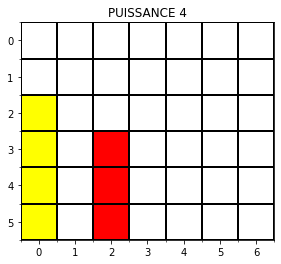

In [82]:

state=[0,0]
board=generate_board()
term=False
niter=0
fig=plt.figure()
images=[]

#-------------------
# Starting the episode
seen_state=[]
while not term:
    print(f"-------ROUND {niter}")
    print(board)
    for player in [1,2] :

        #----------
        #Player choose action
        print(f'--PLAYER {player}--')

        feas_actions=get_possible_action(board)
        if len(feas_actions)==0:
            print("No winner !")
            term=True
            break

        #------------
        #Player action choice
        if player==1:
            try:
                Q_s=Q5_bis[state[player-1]]
                seen_state.append(True)
            except KeyError:
                seen_state.append(False)
                Q_s=np.zeros(shape=(7,))
            action=feas_actions[np.argmax(Q_s[feas_actions])]
        else:
            Q_s=Q_agent2[state[1],:]
            action=feas_actions[np.argmax(Q_s[feas_actions])]

        newState,reward,term=step(action,state[player-1],board,player)
        print(f'from state: {state} using {action}')
        print(f'reached state:{newState} getting reward: {reward}')
        #-------------------------------
        # Stock board frame
        im=plt.imshow(board,animated=True,cmap=cmap)
        ax = plt.gca();
        ax.set_xticks(np.arange(0, 7, 1))
        ax.set_yticks(np.arange(0, 6, 1))
        ax.set_xticks(np.arange(-.5, 7, 1), minor=True)
        ax.set_yticks(np.arange(-.5, 6, 1), minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=2)

        plt.title("PUISSANCE 4")
        images.append([im])

        state[player-1]=newState
        if term: 
            print(f"Player {player} / color {play_id_to_col[player]} WIN")
            break
    
    niter+=1

In [83]:

print(f"Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):{np.any(seen_state)}")
if np.any(seen_state): print(f"Number of estimated Q table rows used: {Counter(seen_state)[True]} ")

Agent3 used at least one  estimated Q table (we reach already seen state in training step of agent3):False


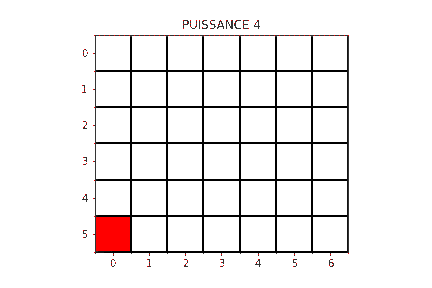

In [84]:

ani = animation.ArtistAnimation(fig, images, interval=1000, blit=True,
                                repeat_delay=100)

ani.save('Agent3VSAgent2_NEW.gif')
Image('Agent3VSAgent2_NEW.gif')

>**When training Agent3 on a subset of states we can win against Agent1 and Agent2.**